In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install -U datasets fsspec==2023.9.2 ftfy regex tqdm lpips
!pip install git+https://github.com/openai/CLIP.git

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 173.4/173.4 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 139.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 107.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 59.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 44.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 19.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [3]:
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as T
from torch.utils.data import DataLoader, Dataset
from torchvision.utils import make_grid
from datasets import load_dataset
from PIL import Image
from tqdm import tqdm
import lpips
import matplotlib.pyplot as plt

In [4]:
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
DRIVE_PATH = '/content/drive/My Drive/VQGAN_CLIP_Experiment'
DATASET_PATH = DRIVE_PATH
CHECKPOINT_PATH = os.path.join(DRIVE_PATH, 'vqgan_checkpoint.pth')
os.makedirs(DRIVE_PATH, exist_ok=True)

In [ ]:
from datasets import Dataset
from datasets import Image as HFImage # Import Image from datasets to avoid name conflict

def load_magic_brush_dataset():
    parquet_file = os.path.join(DATASET_PATH, 'magicbrush_dataset')

    if os.path.exists(parquet_file):
        print(f"Loading dataset from local Parquet: {parquet_file}")
        dataset = Dataset.from_parquet(parquet_file)

        # FIX: Cast the image columns to the correct type to ensure proper decoding.
        # This converts the raw data from the Parquet file into PIL.Image objects.
        print("Casting image columns to ensure correct format...")
        dataset = dataset.cast_column("source_img", HFImage(decode=True))
        dataset = dataset.cast_column("target_img", HFImage(decode=True))
        print("Casting complete.")
        return dataset
    else:
        print("⬇Downloading MagicBrush dataset from Hugging Face...")
        dataset = load_dataset("osunlp/MagicBrush")['train']

        print(f"Saving dataset to Parquet: {parquet_file}")
        os.makedirs(DATASET_PATH, exist_ok=True)
        dataset.to_parquet(parquet_file)
        return dataset

# Usage
raw_dataset = load_magic_brush_dataset()

In [ ]:
import numpy as np

from torch.utils.data import IterableDataset, DataLoader

# --- Augmentations ---
augment = T.Compose([
    # Add this line to convert all images to 3-channel RGB
    T.Lambda(lambda img: img.convert('RGB')),

    T.Resize(286),
    T.RandomCrop(256),
    T.RandomHorizontalFlip(),
    T.ColorJitter(0.1, 0.1, 0.1, 0.05),
    T.ToTensor(),
    T.Normalize([0.5,0.5,0.5], [0.5,0.5,0.5]),  # → [–1,1]
])

# --- IterableDataset Class ---
# This class streams data instead of using indexing, which solves the error.
class MagicBrushIterableDataset(IterableDataset):
    def __init__(self, dataset, transform):
        super().__init__()
        self.dataset = dataset
        self.transform = transform

    def __iter__(self):
        # The iterator yields one transformed image at a time from the source dataset.
        for item in self.dataset:
            # Yield the source image if it exists
            if item.get("source_img"):
                yield self.transform(item["source_img"])
            # Yield the target image if it exists
            if item.get("target_img"):
                yield self.transform(item["target_img"])

# --- Shuffle the source dataset and create the DataLoader ---

# For an IterableDataset, you should shuffle the source data beforehand.
shuffled_raw_dataset = raw_dataset.shuffle(seed=42)
print("Raw dataset shuffled.")

# Create an instance of our new IterableDataset
train_dataset = MagicBrushIterableDataset(shuffled_raw_dataset, augment)

# Create the DataLoader. Note that `shuffle=True` is not used for IterableDatasets.
train_loader = DataLoader(train_dataset, batch_size=16, num_workers=8)

print("IterableDataset and DataLoader are ready for training.")

In [7]:
import matplotlib.pyplot as plt

def show_magicbrush_pair(dataset, index):
    """
    Visualize the source and target image pair at a given index from the MagicBrush dataset.
    """
    item = dataset[index]
    source = item.get("source_img")
    target = item.get("target_img")

    if source is None and target is None:
        print("No images found at index", index)
        return

    fig, axs = plt.subplots(1, 2, figsize=(8, 4))
    if source:
        axs[0].imshow(source)
        axs[0].set_title("Source Image")
    else:
        axs[0].text(0.5, 0.5, "No source", ha='center', va='center')
    axs[0].axis("off")

    if target:
        axs[1].imshow(target)
        axs[1].set_title("Target Image")
    else:
        axs[1].text(0.5, 0.5, "No target", ha='center', va='center')
    axs[1].axis("off")

    plt.tight_layout()
    plt.show()

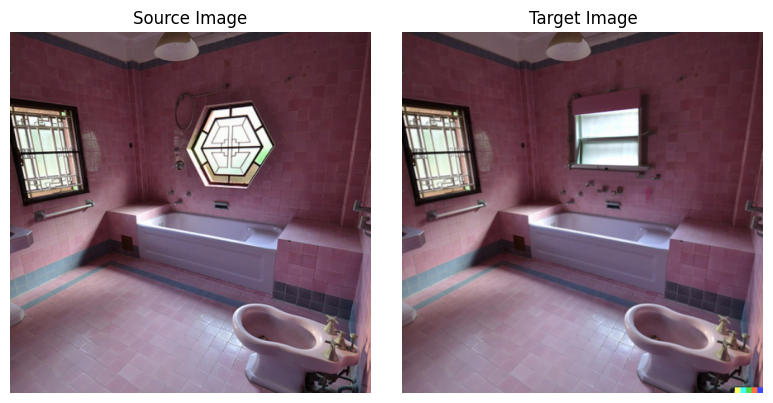

In [ ]:
show_magicbrush_pair(raw_dataset, index=4)

In [8]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class Encoder(nn.Module):
    def __init__(self, in_channels=3, latent_dim=256, input_size=256, neg_slope=0.01):
        super().__init__()
        self.input_size = input_size
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels,  32, kernel_size=3, stride=2, padding=1),
            #nn.BatchNorm2d(32),
            nn.LeakyReLU(neg_slope, inplace=True),

            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),
            #nn.BatchNorm2d(64),
            nn.LeakyReLU(neg_slope, inplace=True),

            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            #nn.BatchNorm2d(128),
            nn.LeakyReLU(neg_slope, inplace=True),
        )
        conv_out = input_size // 8
        flat_dim = 128 * conv_out * conv_out
        self.fc_mu  = nn.Linear(flat_dim, latent_dim)
        self.fc_var = nn.Linear(flat_dim, latent_dim)

    def forward(self, x):
        batch = x.size(0)
        h = self.conv(x)
        h = h.view(batch, -1)
        mu     = self.fc_mu(h)
        logvar = self.fc_var(h)
        return mu, logvar


class Decoder(nn.Module):
    def __init__(self, out_channels=3, latent_dim=256, output_size=256, neg_slope=0.2):
        super().__init__()
        # how big each spatial map is after three stride‑2 upsamples:
        conv_out = output_size // 8
        self.conv_out = conv_out

        # project z → flat feature map
        flat_dim = 128 * conv_out * conv_out
        self.fc = nn.Linear(latent_dim, flat_dim)

        self.deconv = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2,
                               padding=1, output_padding=1),
            #nn.BatchNorm2d(64),
            nn.LeakyReLU(neg_slope, inplace=True),

            nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2,
                               padding=1, output_padding=1),
            #nn.BatchNorm2d(32),
            nn.LeakyReLU(neg_slope, inplace=True),

            nn.ConvTranspose2d(32, 32, kernel_size=3, stride=2,
                               padding=1, output_padding=1),
            #nn.BatchNorm2d(32),
            nn.LeakyReLU(neg_slope, inplace=True),

            nn.Conv2d(32, out_channels, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, z):
        batch = z.size(0)
        # reshape into (B, 128, conv_out, conv_out)
        h = self.fc(z).view(batch, 128, self.conv_out, self.conv_out)
        return self.deconv(h)


class VAE(nn.Module):
    def __init__(self, latent_dim=256, img_size=256):
        super().__init__()
        self.encoder = Encoder(3, latent_dim,  img_size)
        self.decoder = Decoder(3, latent_dim, img_size)

    def reparameterize(self, mu, logvar):
        std = (0.5 * logvar).exp()
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        mu, logvar = self.encoder(x)
        z = self.reparameterize(mu, logvar)
        recon = self.decoder(z)
        return recon, mu, logvar


def vae_loss(recon, x, mu, logvar, kld_weight,
             lpips_fn=None, lpips_weight=0.0):
  # L2 reconstruction
  recons_loss = F.mse_loss(recon, x)

  # Perceptual LPIPS loss
  if lpips_fn is not None and lpips_weight > 0:
    # lpips_fn returns a tensor of shape (N,1,1,1)
    lpips_loss = lpips_fn(recon, x).mean()
  else:
    lpips_loss = torch.tensor(0., device=recon.device)

  # KL divergence
  kld_loss = torch.mean(
    -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp(), dim=1)
  )

  # Total loss
  loss = recons_loss \
         + kld_weight * kld_loss \
         + lpips_weight * lpips_loss

  # Detach the sub‐losses so we can log them without messing with grads
  return (
    loss,
    recons_loss.detach(),
    lpips_loss.detach(),
    kld_loss.detach()
  )

In [17]:
import csv
import matplotlib.pyplot as plt
from tqdm import tqdm
from torchvision.utils import make_grid

def train_vae(model, dataloader, optimizer, device, dataset_size,
  start_epoch=0, num_epochs=60, log_csv='vae_metrics.csv',
  ckpt_path='vae_checkpoint.pth', warmup_epochs=30,
  max_beta=0.3, lpips_weight=0.1):

  lpips_fn = lpips.LPIPS(net='alex').to(device)
  lpips_fn.eval()
  for p in lpips_fn.parameters():
    p.requires_grad = False

  model.to(device)

  #
  if os.path.exists(ckpt_path):
    print("Loading checkpoint...")
    checkpoint = torch.load(ckpt_path, map_location=device)
    model.load_state_dict(checkpoint['model'])
    optimizer.load_state_dict(checkpoint['optimizer'])
    print("Checkpoint loaded.")

  # Prepare CSV
  with open(log_csv, mode='w', newline='') as f:
    writer = csv.writer(f)
    writer.writerow([
      'epoch','beta','recon_loss','lpips_loss',
      'kld_loss','total_loss','latent_std'
    ])

    for epoch in range(start_epoch, num_epochs):
      model.train()
      total_recon = total_lpips = total_kld = 0.0
      total_loss  = total_std   = 0.0
      batch_count = 0

      # β‑warmup
      warmup_ratio = min(1.0, epoch / warmup_epochs)
      beta = (warmup_ratio ** 2) * max_beta

      pbar = tqdm(dataloader, desc=f"Epoch {epoch+1}")
      for x in pbar:
        x = x.to(device)
        optimizer.zero_grad()

        recon, mu, logvar = model(x)

        # minibatch weighting
        M_N = x.size(0) / dataset_size
        kld_weight = M_N * beta

        # Compute all three losses
        loss, recon_loss, lpips_loss, kld_loss = vae_loss(
          recon, x, mu, logvar,
          kld_weight,
          lpips_fn, lpips_weight
        )
        loss.backward()
        optimizer.step()

        # track avg latent σ
        latent_std = logvar.exp().sqrt().mean().item()

        # accumulate for epoch
        total_recon += recon_loss.item()
        total_lpips += lpips_loss.item()
        total_kld   += kld_loss.item()
        total_loss  += loss.item()
        total_std   += latent_std
        batch_count += 1

        pbar.set_postfix({
          'recon': f"{recon_loss.item():.4f}",
          'lpips': f"{lpips_loss.item():.4f}",
          'kld':   f"{kld_loss.item():.4f}",
          'β':     f"{beta:.4f}",
          'std':   f"{latent_std:.4f}"
        })

      # Epoch averages
      avg_recon = total_recon / batch_count
      avg_lpips = total_lpips / batch_count
      avg_kld   = total_kld   / batch_count
      avg_total = total_loss  / batch_count
      avg_std   = total_std   / batch_count

      print(
        f"Epoch {epoch+1}: β={beta:.3f}, "
        f"recon={avg_recon:.4f}, lpips={avg_lpips:.4f}, "
        f"kld={avg_kld:.4f}, total={avg_total:.4f}, "
        f"latent_std={avg_std:.4f}"
      )
      writer.writerow([
        epoch+1, beta,
        avg_recon, avg_lpips, avg_kld,
        avg_total, avg_std
      ])
      f.flush()

      # === Save checkpoint ===
      torch.save({
        'model':     model.state_dict(),
        'optimizer': optimizer.state_dict()
      }, ckpt_path)

      # === Visualize reconstructions ===
      model.eval()
      with torch.no_grad():
        val_batch = next(iter(dataloader))[:8].to(device)
        recon_batch, _, _ = model(val_batch)

        grid = make_grid(
          torch.cat([val_batch, recon_batch], dim=0),
          nrow=8,
          normalize=True,
          value_range=(-1, 1)
        )
        plt.figure(figsize=(16, 4))
        plt.imshow(grid.permute(1, 2, 0).cpu())
        plt.title(f"Epoch {epoch+1} Reconstruction")
        plt.axis("off")
        plt.show()

In [18]:
model = VAE(latent_dim=256, img_size=256).to(DEVICE)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
dataset_size = len(train_dataset.dataset)

In [19]:
print (dataset_size)

8807


In [20]:
# Create paths for output
VAE_CKPT_PATH = os.path.join(DRIVE_PATH, 'vae_checkpoint.pth')
VAE_CSV_PATH = os.path.join(DRIVE_PATH, 'vae_metrics.csv')

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/alex.pth
🔁 Loading checkpoint...
✅ Checkpoint loaded.


Epoch 3: 8808it [26:20,  5.57it/s, recon=0.0404, lpips=0.3545, kld=860.5778, β=0.0013, std=0.0389]


Epoch 3: β=0.001, recon=0.0579, lpips=0.3841, kld=835.2464, total=0.1752, latent_std=0.0471


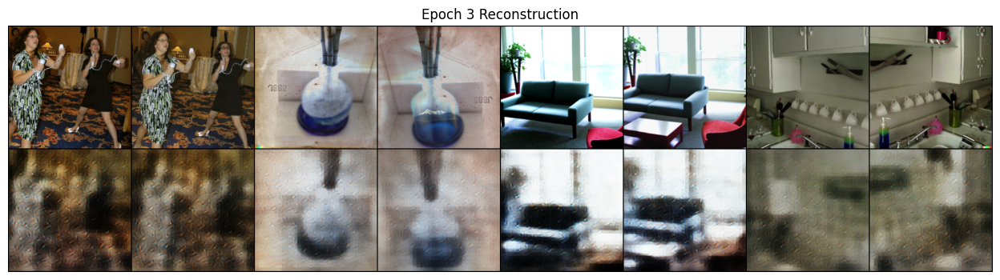

Epoch 4: 8808it [26:26,  5.55it/s, recon=0.0404, lpips=0.3477, kld=754.6708, β=0.0030, std=0.0553]


Epoch 4: β=0.003, recon=0.0572, lpips=0.3763, kld=721.7425, total=0.1740, latent_std=0.0635


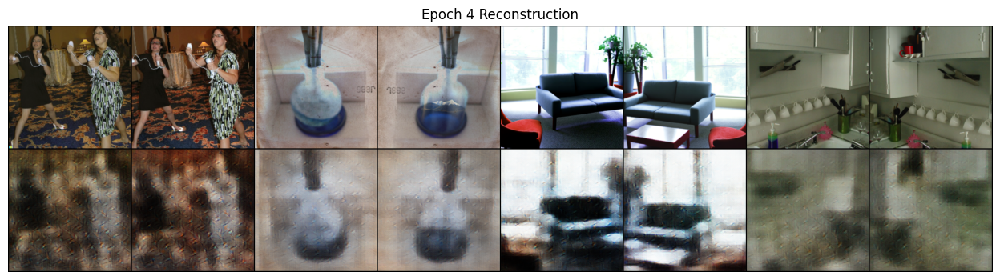

Epoch 5: 8808it [26:49,  5.47it/s, recon=0.0393, lpips=0.3433, kld=673.5527, β=0.0053, std=0.0708]


Epoch 5: β=0.005, recon=0.0571, lpips=0.3705, kld=644.5637, total=0.1745, latent_std=0.0829


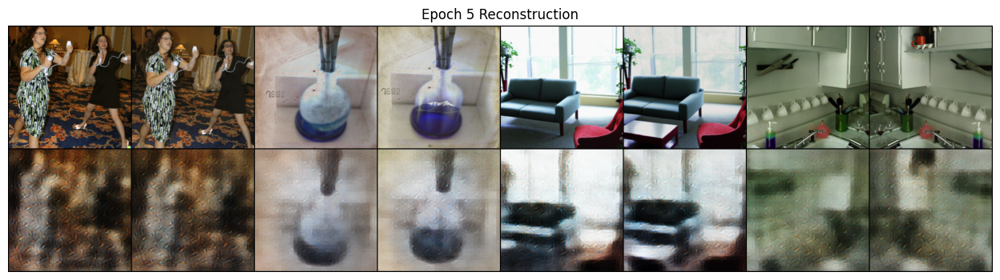

Epoch 6: 8808it [27:16,  5.38it/s, recon=0.0382, lpips=0.3360, kld=601.5585, β=0.0083, std=0.0923]


Epoch 6: β=0.008, recon=0.0572, lpips=0.3654, kld=583.9494, total=0.1757, latent_std=0.1039


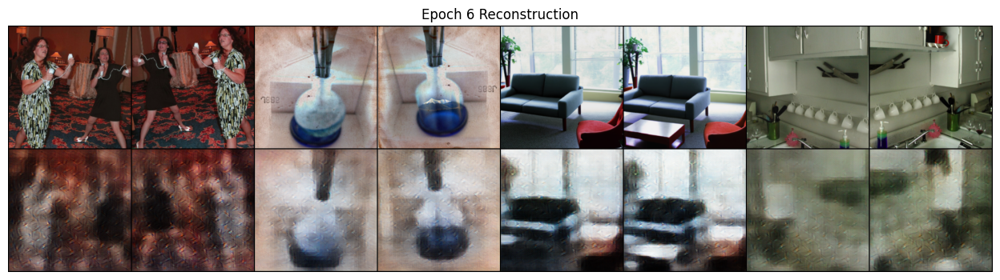

Epoch 7: 8808it [27:33,  5.33it/s, recon=0.0395, lpips=0.3324, kld=563.9682, β=0.0120, std=0.1057]


Epoch 7: β=0.012, recon=0.0577, lpips=0.3613, kld=534.1240, total=0.1777, latent_std=0.1258


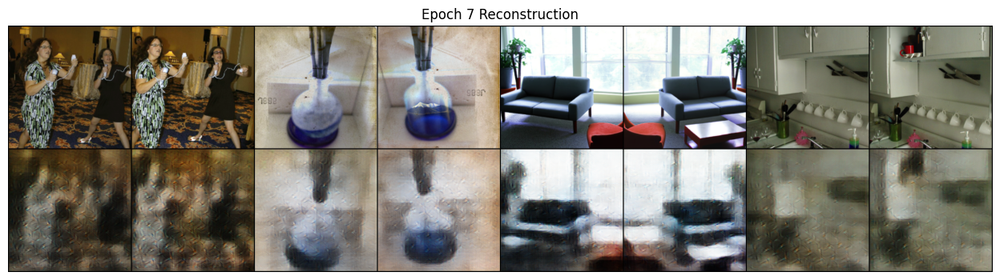

Epoch 8: 8808it [27:52,  5.27it/s, recon=0.0429, lpips=0.3334, kld=515.2278, β=0.0163, std=0.1330]


Epoch 8: β=0.016, recon=0.0581, lpips=0.3580, kld=491.4152, total=0.1801, latent_std=0.1483


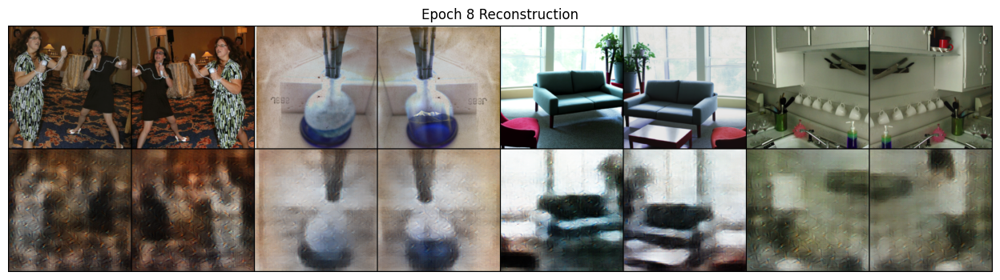

Epoch 9: 8808it [28:21,  5.18it/s, recon=0.0406, lpips=0.3280, kld=477.9891, β=0.0213, std=0.1485]


Epoch 9: β=0.021, recon=0.0588, lpips=0.3558, kld=454.0962, total=0.1832, latent_std=0.1715


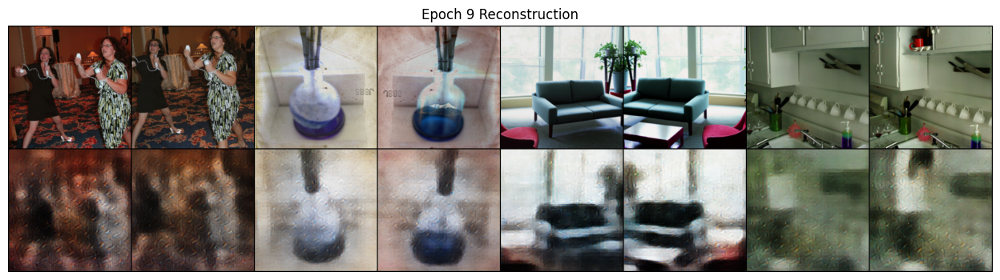

Epoch 10: 8808it [28:45,  5.10it/s, recon=0.0417, lpips=0.3232, kld=444.0280, β=0.0270, std=0.1702]


Epoch 10: β=0.027, recon=0.0596, lpips=0.3542, kld=420.9446, total=0.1864, latent_std=0.1952


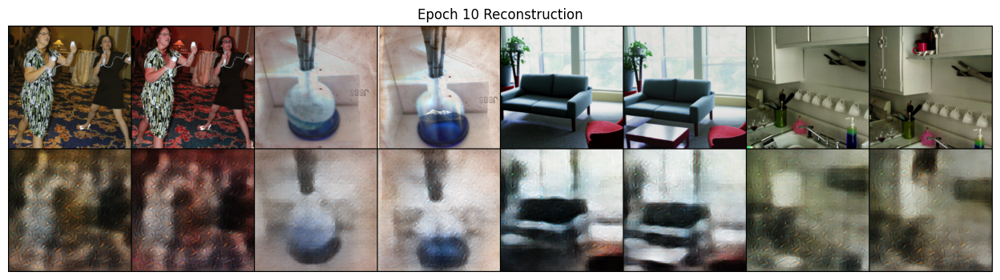

Epoch 11: 8808it [29:18,  5.01it/s, recon=0.0456, lpips=0.3242, kld=410.7760, β=0.0333, std=0.1962]


Epoch 11: β=0.033, recon=0.0604, lpips=0.3530, kld=390.9521, total=0.1900, latent_std=0.2196


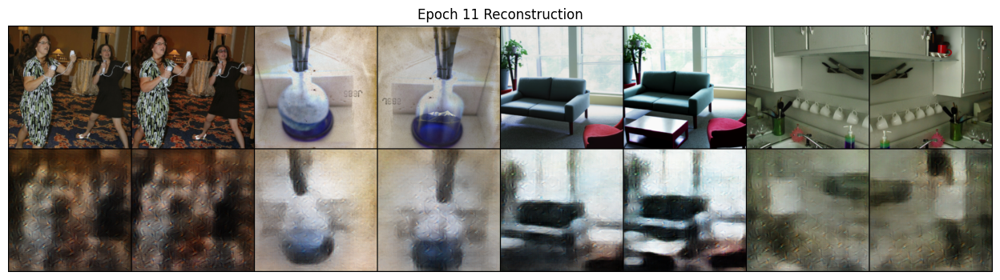

Epoch 12: 8808it [30:07,  4.87it/s, recon=0.0439, lpips=0.3285, kld=384.8730, β=0.0403, std=0.2164]


Epoch 12: β=0.040, recon=0.0614, lpips=0.3524, kld=363.6055, total=0.1938, latent_std=0.2446


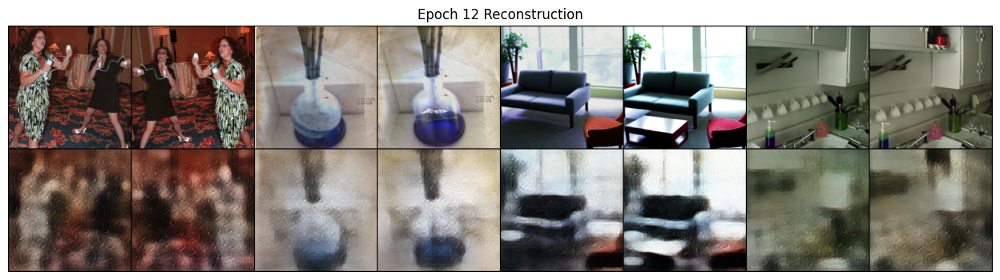

Epoch 13: 8808it [30:14,  4.86it/s, recon=0.0465, lpips=0.3248, kld=355.6535, β=0.0480, std=0.2419]


Epoch 13: β=0.048, recon=0.0626, lpips=0.3523, kld=338.1100, total=0.1978, latent_std=0.2707


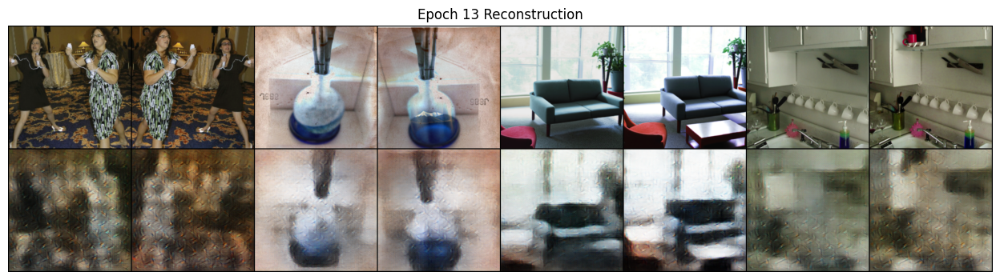

Epoch 14: 8808it [29:55,  4.91it/s, recon=0.0473, lpips=0.3313, kld=327.7010, β=0.0563, std=0.2684]


Epoch 14: β=0.056, recon=0.0639, lpips=0.3527, kld=314.3090, total=0.2019, latent_std=0.2976


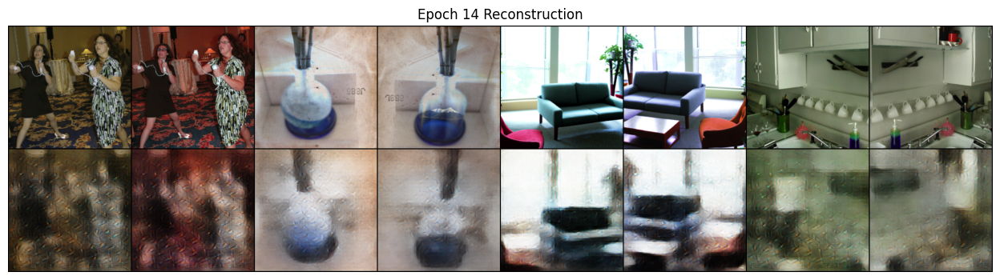

Epoch 15: 8808it [29:49,  4.92it/s, recon=0.0510, lpips=0.3293, kld=300.5071, β=0.0653, std=0.3052]


Epoch 15: β=0.065, recon=0.0652, lpips=0.3537, kld=291.5436, total=0.2059, latent_std=0.3261


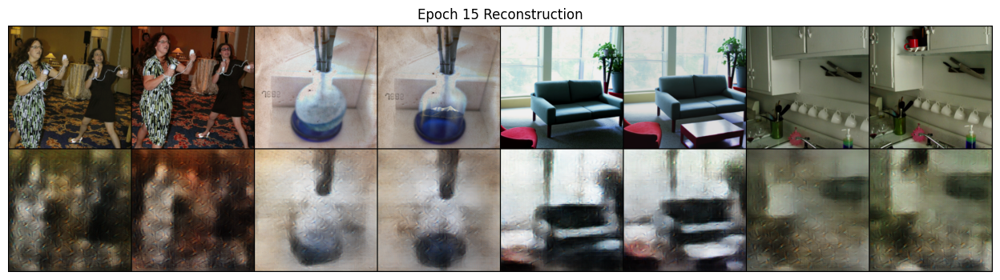

Epoch 16: 8808it [29:52,  4.91it/s, recon=0.0453, lpips=0.3283, kld=275.1779, β=0.0750, std=0.3290]


Epoch 16: β=0.075, recon=0.0666, lpips=0.3551, kld=270.1703, total=0.2100, latent_std=0.3555


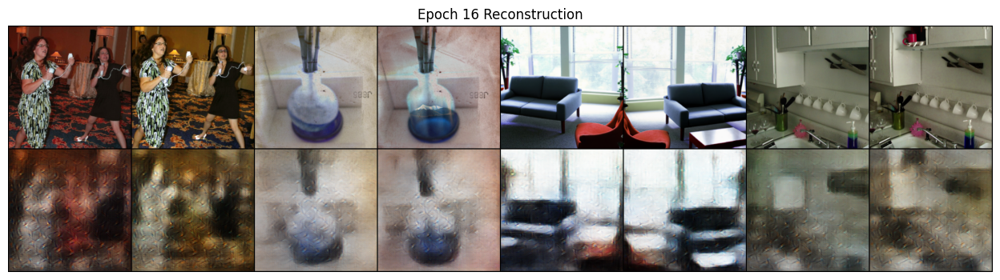

Epoch 17: 8808it [29:45,  4.93it/s, recon=0.0502, lpips=0.3340, kld=252.4847, β=0.0853, std=0.3630]


Epoch 17: β=0.085, recon=0.0682, lpips=0.3568, kld=249.9532, total=0.2140, latent_std=0.3859


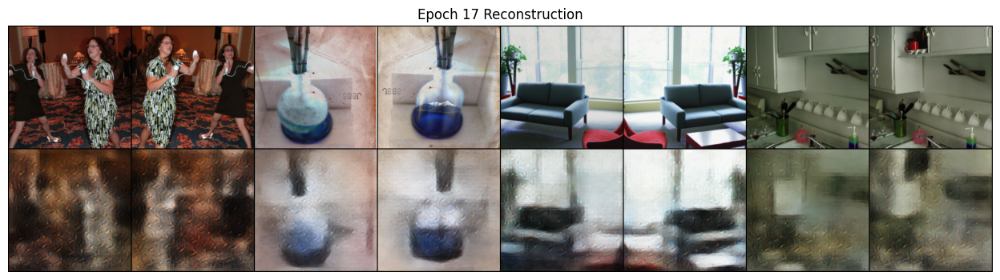

Epoch 18: 8808it [29:41,  4.94it/s, recon=0.0502, lpips=0.3364, kld=228.2507, β=0.0963, std=0.3958]


Epoch 18: β=0.096, recon=0.0700, lpips=0.3590, kld=230.7620, total=0.2180, latent_std=0.4174


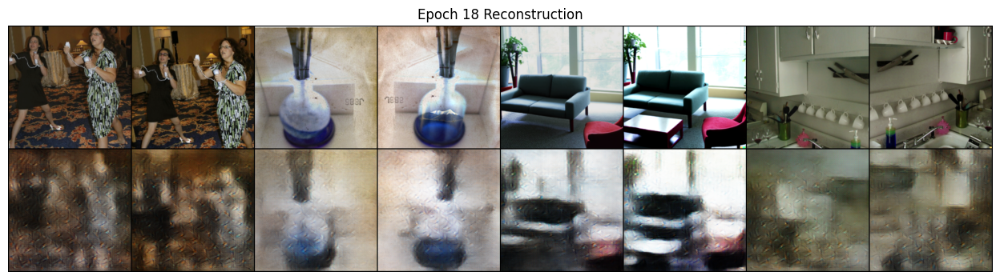

Epoch 19: 8808it [29:58,  4.90it/s, recon=0.0506, lpips=0.3370, kld=206.3631, β=0.1080, std=0.4293]


Epoch 19: β=0.108, recon=0.0717, lpips=0.3614, kld=212.3389, total=0.2218, latent_std=0.4502


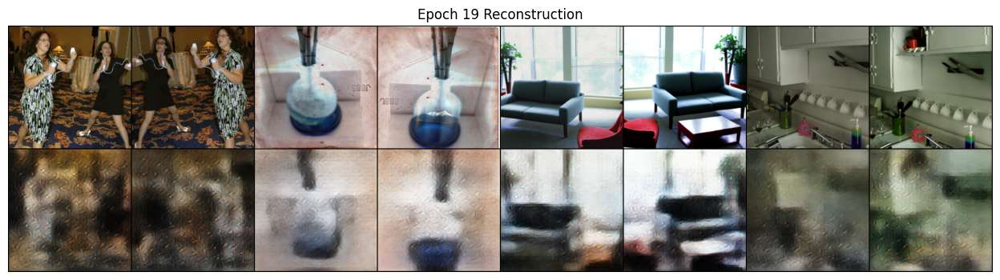

Epoch 20: 8808it [29:57,  4.90it/s, recon=0.0555, lpips=0.3424, kld=200.4711, β=0.1203, std=0.4618]


Epoch 20: β=0.120, recon=0.0736, lpips=0.3641, kld=194.8934, total=0.2255, latent_std=0.4838


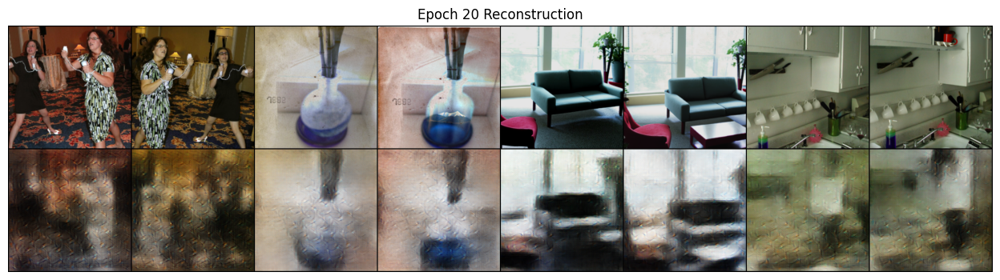

Epoch 21: 8808it [29:52,  4.91it/s, recon=0.0568, lpips=0.3424, kld=179.1532, β=0.1333, std=0.5024]


Epoch 21: β=0.133, recon=0.0757, lpips=0.3669, kld=178.4479, total=0.2290, latent_std=0.5178


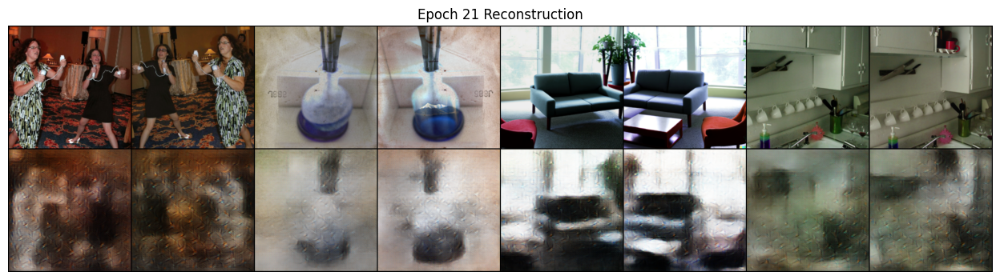

Epoch 22: 5975it [20:17,  4.91it/s, recon=0.0735, lpips=0.3789, kld=155.9038, β=0.1470, std=0.5493]


KeyboardInterrupt: 

In [21]:
# Train the model
train_vae(
    model=model,
    dataloader=train_loader,
    optimizer=optimizer,
    device=DEVICE,
    dataset_size=dataset_size,
    start_epoch=0,
    num_epochs=60,
    log_csv=VAE_CSV_PATH,
    ckpt_path=VAE_CKPT_PATH,
    warmup_epochs=30,
    max_beta=0.3,
    lpips_weight=0.3
)